In [1]:
import tables
import numpy as np
import matplotlib.pyplot as plt
from ctapipe.containers import EventType
from ctapipe.visualization import CameraDisplay
from ctapipe.coordinates import EngineeringCameraFrame
from ctapipe_io_lst import LSTEventSource
from matplotlib.animation import FuncAnimation

from IPython.display import HTML  # <-- Crucial for notebooks

## Notebook to open a DL1 file and display its contents in different ways

In [2]:
# This is just to obtain the information on the LST camera geometry:
# (you can ignore warnings on missing reference metadata)
sa = LSTEventSource.create_subarray(tel_id=1)
focal_length = sa.tel[1].optics.equivalent_focal_length
camera_geom = sa.tel[1].camera.geometry

/data/cta/software/conda/miniforge3/envs/lstchain-v0.12.3/lib/python3.11/site-packages/ctapipe/core/provenance.py:280: MissingReferenceMetadata: Could not read reference metadata for input file: /data/cta/software/conda/miniforge3/envs/lstchain-v0.12.3/lib/python3.11/site-packages/ctapipe_io_lst/resources/oversampled_pulse_LST_8dynode_pix6_20200204.dat
  warnings.warn(


In [3]:
# Open the file

# dl1file = tables.open_file("/data/cta/users-ifae/moralejo/CTA/summer_student_2026/DL1/dl1_LST-1.Run24704.0008.h5")
dl1file = tables.open_file("/data/cta/users-ifae/moralejo/CTA/summer_student_2026/DL1/dl1_LST-1.Run20721.0032.h5")

In [4]:
# There are two tables. 

# One is the parameters table, where event-wise information is stored. For example, the Hillas parameters of the image (Length, Width, 
# and others), its center of gravity (x, y) and others. Check the code at the lstchain GitHub for the descriptions. 
partable = dl1file.root.dl1.event.telescope.parameters.LST_LSTCam # Contains event-wise image parameters

# The other table contains pixel-wise information from each event: the extracted charges ("image") and times of the pulses within the 36-ns readout 
# window ("peak_time").
imagetable = dl1file.root.dl1.event.telescope.image.LST_LSTCam # Contains event-wise images (i.e. pixel-wise charges and times)

In [5]:
partable.cols

/dl1/event/telescope/parameters/LST_LSTCam.cols (Cols), 44 columns
  obs_id (Column(np.int64(58652),), int64)
  event_id (Column(np.int64(58652),), int64)
  intensity (Column(np.int64(58652),), float64)
  log_intensity (Column(np.int64(58652),), float64)
  x (Column(np.int64(58652),), float64)
  y (Column(np.int64(58652),), float64)
  r (Column(np.int64(58652),), float64)
  phi (Column(np.int64(58652),), float64)
  length (Column(np.int64(58652),), float64)
  length_uncertainty (Column(np.int64(58652),), float64)
  width (Column(np.int64(58652),), float64)
  width_uncertainty (Column(np.int64(58652),), float64)
  psi (Column(np.int64(58652),), float64)
  skewness (Column(np.int64(58652),), float64)
  kurtosis (Column(np.int64(58652),), float64)
  time_gradient (Column(np.int64(58652),), float64)
  intercept (Column(np.int64(58652),), float64)
  leakage_intensity_width_1 (Column(np.int64(58652),), float32)
  leakage_intensity_width_2 (Column(np.int64(58652),), float32)
  leakage_pixels_

In [6]:
imagetable.cols

/dl1/event/telescope/image/LST_LSTCam.cols (Cols), 8 columns
  obs_id (Column(np.int64(58652),), int64)
  event_id (Column(np.int64(58652),), int64)
  image (Column(np.int64(58652), 1855), ('<f4', (1855,)))
  peak_time (Column(np.int64(58652), 1855), ('<f4', (1855,)))
  image_mask (Column(np.int64(58652), 1855), ('?', (1855,)))
  is_valid (Column(np.int64(58652),), bool)
  tel_id (Column(np.int64(58652),), int64)
  selected_gain_channel (Column(np.int64(58652), 1855), ('<i8', (1855,)))

In [7]:
# Event type. "SUBARRAY" is the ky code for "cosmics" (=showers)
evtype = partable.col('event_type')
cosmics = evtype == EventType.SUBARRAY.value # filter to select cosmics (= showers)

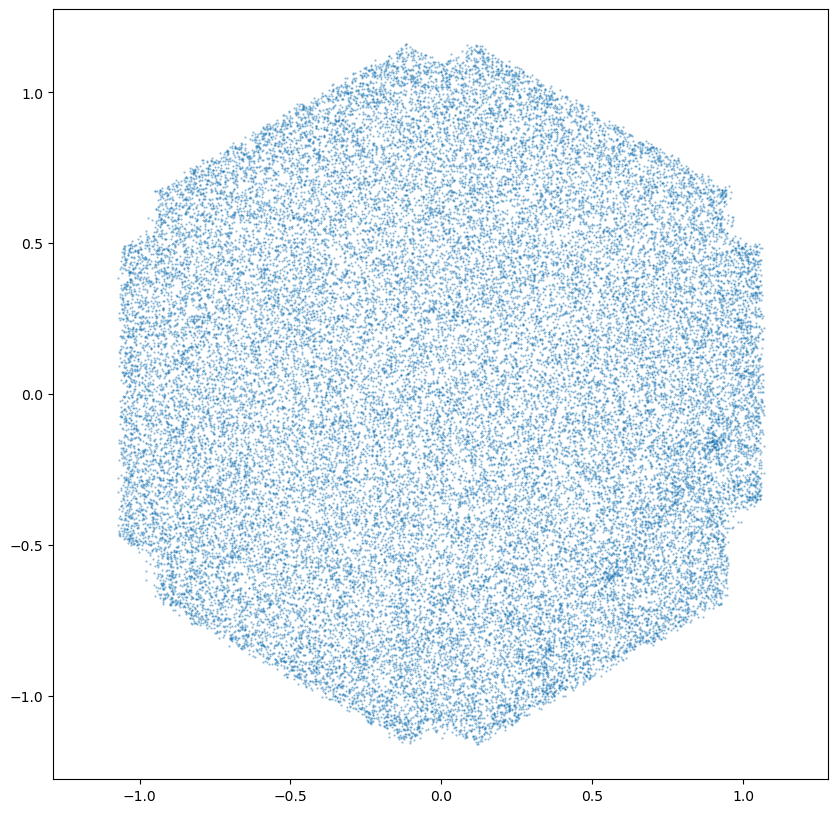

In [8]:
# Example: Position of the center of gravity of images. This is only for events which survived cleaning. i.e. intensity>0
plt.figure(figsize=(10,10))
plt.scatter(-partable.col('y')[cosmics], -partable.col('x')[cosmics], s=0.3, alpha=0.5)
plt.axis('equal')
plt.show()

In [9]:
# dragon_time is the event timestamp. By subtracting the last and the first values (max and min) we obtain the subrun's elapsed time:
elapsed_time = partable.col('dragon_time').max() - partable.col('dragon_time').min()
elapsed_time

np.float64(9.011672019958496)

In [10]:
# Now some checks motivated by the strange behaviour of subrun 20715.0000: very high trigger rate, but not a high rate of events
# after cleaning. When an event survived cleaning, it has intensity >0  (intensity, which has units of photoelectrons, is the sum of the charges of 
# all pixels which survive cleasning) 

# Fraction of cosmics which survive cleaning (should be ~0.60 to 0.85, depending on observation conditions)
(cosmics & (partable.col('intensity')>0)).sum() / cosmics.sum()

np.float64(0.7144938986919498)

In [11]:
# Rate of cosmics (dependent on observation conditions, 2k - 10k /s, approx. If it gets close to 14-15k, it means the data acquisition is 
# being saturated (=high dead time), generally from some non-shower events:
cosmics.sum() / elapsed_time

np.float64(6320.1368041202095)

In [12]:
# the other types of events (interleaved pedestals and flat-field events):
pedestals_mask =  partable.col('event_type') == EventType.SKY_PEDESTAL.value
flatfield_mask = partable.col('event_type') == EventType.FLATFIELD.value

In [13]:
#Rate of interleaved flatfield events (should be ~100 Hz). Lower values indicate high dead time.:
flatfield_mask.sum() / elapsed_time

np.float64(94.10018452978558)

In [14]:
#Rate of interleaved pedestal events (should be ~100 Hz). Lower values indicate high dead time.:
pedestals_mask.sum() / elapsed_time

np.float64(94.21115172852353)

In [15]:
# The column of the image table which contains the pixel charges:
imagetable.col('image').shape

(58652, 1855)

In [16]:
# Only the showers (cosmics):
imagetable.col('image')[cosmics, :].shape

(56955, 1855)

In [17]:
# Now check how many times each pixels has a charge above a given threshold:
threshold = 8 # photoelectrons per pixel
above_threshold = imagetable.col('image')[cosmics, :]>threshold # (n_cosmics, n_pixels)

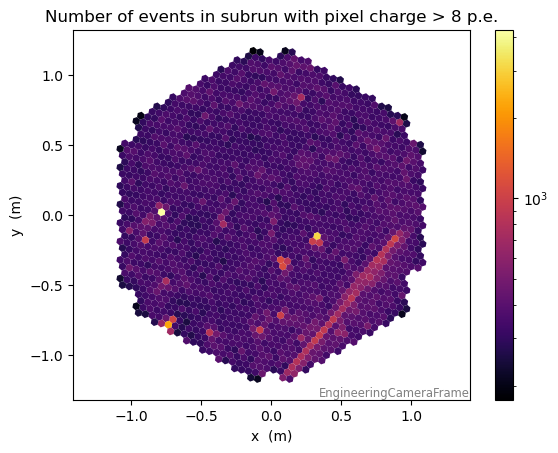

In [18]:
# Show that in a camera plot:
camdisplay = CameraDisplay(camera_geom.transform_to(EngineeringCameraFrame()),
                           norm='log', title=f'Number of events in subrun with pixel charge > {threshold} p.e.', 
                           image=np.sum(above_threshold, axis=0))
camdisplay.autoupdate = True
camdisplay.add_colorbar()
plt.show()

In [19]:
#
# NOTES FOR SUBRUN Run20715.0000: there is a clear group of ~12 pixels with high fraction of >8 p.e signals. Some of those pixels with more 
# than 10^4 events (out of ~58k cosmics).
# The surprising thing is that they only produce a small effect after cleaning (see CoG plot above). The explanation is that although all those pixels produce 
# >8 p.e. signals quite often, they are not "coordinated" - the cleaning requires that in a given event there are at least two neighbor pixels with more 
# than 8 p.e. We will see below, with an event movie, that such coincidence is not happening very often.
#
# My conclusion: that group of pixels are noisier-than-usual pixels. It is most likely due to the presence of a star, one which is bright enough to increase the 
# trigger rate, but not bright enough (unlike e.g. the satellite of the other run) to produce a significant increase of the rate of events which survive cleaning.

# As we will see below, that level of noise is decreasing through the subrun, most likely because the trigger system is automatically adapting to the presence of 
# the star ("automatic rate control)". this happens typically at the beginning of a run (this is subrun .0000), because the telescope pointing (in sky coordinates 
# RA, dec)has just been changed, and a the positions of stars in the FoV changes as well.
# 
# You should see more of this kind of anomalies in other subruns at the beginning of a run. Just keep them if they pass thye filters, but in all likelihood, 
# high rates at the first subrun (may be the first two) are just due to this feature of the telescope.
#

In [20]:
# Locate the pixel with most such signals >threshold:
max_pix = np.argmax(np.sum(above_threshold, axis=0))
max_pix

np.int64(854)

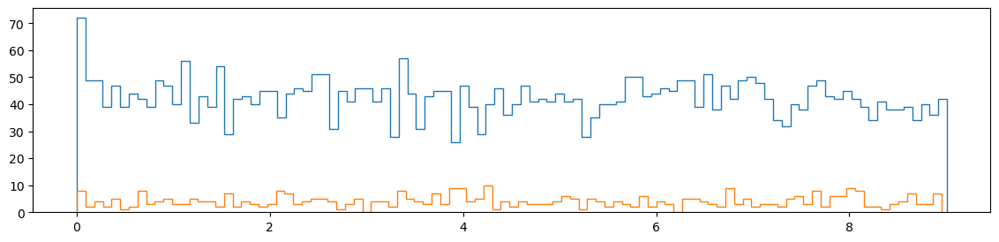

In [21]:
# Now plot the evolution of that pixel's charge through the subrun:
plt.figure(figsize=(14,3))

time_from_start = partable.col('dragon_time') - partable.col('dragon_time')[0] # in seconds
time_from_start = time_from_start[cosmics] # only for cosmics

plt.hist(time_from_start[above_threshold[:,max_pix]], bins=100, histtype='step')
# Show also the central pixel, for comparison:
plt.hist(time_from_start[above_threshold[:,0]], bins=100, histtype='step')
plt.show()

# For subrun Run20715.0000: clearly, the misbehaving pixel is converging towards a normal beheviour.  

In [22]:
#
# Produce event movie (with a given number of frames for the whole run)
# Note: this is rather slow, it takes ~20 s for 50 frames. It is also quite memory hungry, again depending on the number of frames
#

number_of_frames = 50  # For the whole subrun. One frame selected every N events, so that the number of frames covers it completely
event_step = int(cosmics.sum() / number_of_frames)
min_charge = 0 # photoelectrons
max_charge = 30 # photoelectrons   z-axis limits, for better visualization

# Use instead min_charge = 8 and max_charge = 12 if you want to see easily where in the camera you have 
# pixels which survive the 1st condition of standard cleaning (>8 p.e.)


fig, ax = plt.subplots(figsize=(8, 8))

camdisplay = CameraDisplay(camera_geom.transform_to(EngineeringCameraFrame()),
                           norm='lin', title='Pixel charges', ax=ax, autoscale=False)

camdisplay.add_colorbar()
camdisplay.set_limits_minmax(min_charge, max_charge)

my_frames = imagetable.col('image')[cosmics, :][::event_step]

def update(frame_index):
    # print(frame_index)
    # Retrieve the pixel array for the current frame
    current_image = my_frames[frame_index]
    # Assigning to .image forces ctapipe to refresh the internal artists
    camdisplay.image = current_image
        
    # Return the internal PatchCollection artist for blitting optimization
    return camdisplay.pixels,

ani = FuncAnimation(
    fig, 
    update, 
    frames=number_of_frames,  # Number of frames 
    interval=50, 
    blit=True
)

plt.close(fig) 
# Render the interactive media player inline
HTML(ani.to_jshtml())


# For subrun Run20715.0000: the pixels on the right edge of the camera do show some higher noise than others, but indeed there does not seem to be many 
# events in which several of them are bright at the same time (thus explaining the low survival rate to the image cleaning)

In [23]:
#
# Now a movie of the CoGs of images:
#
number_of_frames = 100
event_range = np.linspace(0, int(cosmics.sum()), number_of_frames+1, dtype='int') 

# NOTE: in order to obtain the standard camera coordinates ("EngineeringCameraFrame") we have to do x' == -y ,  y' == -x  :
my_frames = [[-partable.col('y')[cosmics][i1:i2], -partable.col('x')[cosmics][i1:i2]] for i1, i2 in zip(event_range[:-1], event_range[1:])]

fig, ax = plt.subplots(figsize=(8, 8))
scatter = ax.scatter([], [], s=2, alpha=0.3)
plt.xlim(-1.2, 1.2)
plt.ylim(-1.2, 1.2)
plt.xlabel('x (m)')
plt.ylabel('y (m)')

def init():
    scatter.set_offsets(np.empty((0, 2)))
    return scatter,
    
def update(frame_index):
    cog_xy = my_frames[frame_index]
    scatter.set_offsets(np.column_stack((cog_xy[0], cog_xy[1])))
    return scatter,

ani = FuncAnimation(
    fig, 
    update,
    init_func=init,
    frames=number_of_frames,  # Number of frames 
    interval=50, 
    blit=True
)

plt.close() 
# Render the interactive media player inline
HTML(ani.to_jshtml())
